In [1]:
cd AdversarialRendering/

/home/dcor/niskhizov/AdversarialRendering


In [2]:
import torch
import torch.nn as nn
import torchvision.models as models

import glob
import tqdm
import matplotlib.pyplot as plt
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
import time
from tqdm import tqdm
import copy
from IPython.display import display, Image, clear_output

import tqdm

In [3]:
import torchvision

tt = torchvision.transforms.ToTensor()

In [4]:
from utils.classfier import *


In [5]:
import cv2
import cv2.aruco as aruco
import numpy as np

# Define parameters for ArUco marker detection
aruco_dict_type = cv2.aruco.DICT_6X6_250 # Change dictionary type if needed
marker_length = 0.05  # Marker length in meters (adjust as needed)
aruco_dict = cv2.aruco.getPredefinedDictionary(aruco_dict_type)

marker_id = 42
marker_size = 500  # Size in pixels
marker_image = cv2.aruco.generateImageMarker(aruco_dict, marker_id, marker_size)


aruco_dict = aruco.getPredefinedDictionary(aruco_dict_type)
parameters = aruco.DetectorParameters()

# Detect ArUco markers
detector = aruco.ArucoDetector(aruco_dict, parameters)

In [6]:
from diffusers import StableDiffusionPipeline
import torch

# Load stable diffusion model
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")

device = 'cuda' if torch.cuda.is_available() else 'cpu'
vae=  pipe.vae.to(device).eval()

def decode_latents_grad(latents):
    # latents = F.interpolate(latents, (64, 64), mode='bilinear', align_corners=False)
    latents = 1 / 0.18215 * latents

    imgs = vae.decode(latents).sample

    imgs = (imgs / 2 + 0.5).clamp(0, 1)

    return imgs

def decode_latents(latents):
    # latents = F.interpolate(latents, (64, 64), mode='bilinear', align_corners=False)
    with torch.no_grad():
        with torch.amp.autocast(device):
            latents = 1 / 0.18215 * latents

            with torch.no_grad():
                imgs = vae.decode(latents).sample

            imgs = (imgs / 2 + 0.5).clamp(0, 1)

    return imgs

def encode_imgs(imgs):
    # imgs: [B, 3, H, W]
    with torch.no_grad():
        with torch.amp.autocast(device):
            imgs = 2 * imgs - 1

            posterior = vae.encode(imgs).latent_dist
            latents = posterior.sample() * 0.18215

    return latents



WARNING[XFORMERS]: xFormers can't load C++/CUDA extensions. xFormers was built for:
    PyTorch 2.5.1+cu121 with CUDA 1201 (you have 2.6.0+cu124)
    Python  3.12.8 (you have 3.12.2)
  Please reinstall xformers (see https://github.com/facebookresearch/xformers#installing-xformers)
  Memory-efficient attention, SwiGLU, sparse and more won't be available.
  Set XFORMERS_MORE_DETAILS=1 for more details


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [7]:
latent = (torch.rand((1,4, 4, 4), device=device) - 0.5) * 2
with torch.no_grad():
    decoded_latents = decode_latents(latent)


l_size = decoded_latents.shape[-1]
orig_img_corners = np.array([[0,0],[0,l_size],[l_size,l_size],[l_size,0]], dtype=np.float32)


In [8]:
# import all pngs from multiview\valid_frames
import cv2
import os
import glob

valid_frame_paths = glob.glob('./multiview/valid_frames/*.png')

valid_frames = []

Hs = []

for path in tqdm.tqdm_notebook(valid_frame_paths):
    img = cv2.imread(path)
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    valid_frames.append(img)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    corners, ids, _ = detector.detectMarkers(gray)

    if ids is not None:

        dst_pts = corners[0][0]
        H, _ = cv2.findHomography(orig_img_corners, dst_pts, cv2.RANSAC)

        Hs.append(H)



/tmp/ipykernel_1850226/2673969662.py:12: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for path in tqdm.tqdm_notebook(valid_frame_paths):


  0%|          | 0/655 [00:00<?, ?it/s]

In [9]:
from torch.utils.data import Dataset, DataLoader

class framesDataset(Dataset):
    def __init__(self, frames, Hs):
        self.frames = frames
        self.Hs = Hs

    def __len__(self):
        return len(self.frames)

    def __getitem__(self, idx):
        frame = self.frames[idx]
        H = self.Hs[idx]

        # Convert to tensor and normalize
        frame_tensor = tt(frame)

        return frame_tensor, H.astype(np.float32)

In [10]:
import kornia
dst_img_shape = valid_frames[0].shape[:2]
def warp(decoded_latents,H_t):
    warped_imgs = []
    for decoded_latent in decoded_latents:
        img = decoded_latent.unsqueeze(0).float().repeat(H_t.shape[0], 1, 1, 1)
        w=  kornia.geometry.transform.warp_perspective(img, H_t, dst_img_shape)
        warped_imgs.append(w)
    return torch.stack(warped_imgs, dim=0).squeeze(1)


In [11]:
ds = framesDataset(valid_frames, Hs)

train,test = torch.utils.data.random_split(ds, [int(len(ds)*0.8), len(ds)-int(len(ds)*0.8)])
train_loader = DataLoader(train, batch_size=30, shuffle=True, num_workers=2)
test_loader = DataLoader(test, batch_size=30, shuffle=False, num_workers=2)

In [12]:
dl = DataLoader(ds, batch_size=30, shuffle=True, num_workers=2)

In [13]:
raise

RuntimeError: No active exception to reraise

In [ ]:
frames, H_t = next(iter(dl))

In [ ]:
import torchvision
device = 'cuda'

latent = (torch.rand((1,4, 4, 4), device=device) - 0.5) * 2

latent.requires_grad = True


latent_opt = torch.optim.Adam([latent], lr=0.1)

In [ ]:

with torch.no_grad():
        
    w = warp(decoded_latents.float(), H_t.cuda())

    w_mask  =warp(decoded_latents*0+1, H_t.cuda())



In [ ]:
blend_ratio = 1
sum_tensor = ((w_mask != 0) * -blend_ratio + 1) * frames.cuda() + w *blend_ratio


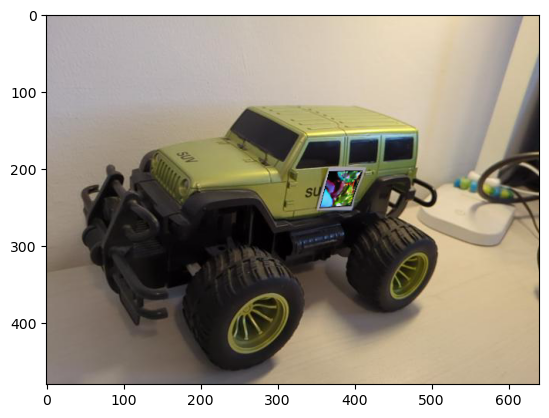

In [ ]:
plt.imshow(sum_tensor[2][2].cpu().permute(1,2,0).numpy())

In [ ]:
i = 0 
# blend_ratio = 1
for epoch in range(1000):
    for frames, H_t in tqdm.tqdm_notebook(dl):

        i += 1
        # adv_loss = lbfgs_latent_opt.step(latent_closure_adp)

        frames = frames.to('cuda')

        blend_ratio = 1#torch.rand(1).cuda() * 0.5 + 0.5
        # if i < 100:
        #     jitter = lambda x: x
        # else:
        #     jitter = T.ColorJitter(brightness=0.1,contrast=0.1,saturation=0.1)
            
        latent_opt.zero_grad()
        adv_patch = decode_latents_grad(latent).float()

        adv_patch_m = adv_patch# jitter(mapper(adv_patch))

        # w_mask  =warp(adv_patch_m*0+1)
        # w  =warp(adv_patch_m)
        w_mask  =warp(adv_patch_m*0+1, H_t.cuda())
        w  = warp(adv_patch_m, H_t.cuda())

        sum_tensor = ((w_mask != 0) * -blend_ratio + 1) * frames + w *blend_ratio

        sum_tensor = sum_tensor.view(sum_tensor.shape[0]*sum_tensor.shape[1], sum_tensor.shape[2], sum_tensor.shape[3], sum_tensor.shape[4])

        adv_loss = adv_loss_calc2(sum_tensor).mean() #+ adv_patch.norm() / 10000
        
        adv_loss.backward()

        if i % 1 == 0:
            latent_opt.step()

        if i % 200 == 0:
            # print(f"Iteration {i}, Loss: {latent_closure_adp().item():.4f}")
            print(f"Iteration {i}, Loss: {adv_loss.item():.4f}. grad_norm: {latent.grad.norm().item():.4f}")

            with torch.no_grad():

                adv_patch = decode_latents(latent).float()
                
                adv_patch_m = adv_patch# jitter(mapper(adv_patch))

                # w_mask  =warp(adv_patch_m*0+1)
                # w  =warp(adv_patch_m)
                w_mask  =warp(adv_patch_m*0+1, H_t.cuda())
                w  = warp(adv_patch_m, H_t.cuda())

                sum_tensor = ((w_mask != 0) * -blend_ratio + 1) * frames + w *blend_ratio

                sum_tensor = sum_tensor.view(sum_tensor.shape[0]*sum_tensor.shape[1], sum_tensor.shape[2], sum_tensor.shape[3], sum_tensor.shape[4])


                adv_loss = adv_loss_calc2(sum_tensor)

                sum_tensor = sum_tensor.cpu()
                argmin = torch.argmin(adv_loss).cpu().item()

                plt.imshow(sum_tensor[argmin].permute(1,2,0).numpy())
                plt.show()
                print(resnet_predict(sum_tensor[argmin].unsqueeze(0).cuda()))

                test_pred = resnet_predict(sum_tensor.cuda())
                if type(test_pred) == list:
                    print(np.unique(resnet_predict(sum_tensor.cuda()),return_counts=True))
                # print(lx)

# multiview Net

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F


resizer = torchvision.transforms.Resize((32, 32)).cuda()

class CNNEncoder(nn.Module):
    def __init__(self):
        super(CNNEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=4, stride=2, padding=1),   # → 32x240x320
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=1),  # → 64x120x160
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=1), # → 128x60x80
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=4, stride=2, padding=1),# → 256x30x40
            nn.ReLU(),
            nn.Conv2d(32, 16, kernel_size=4, stride=2, padding=1),# → 128x15x20
            nn.ReLU(),
            nn.Conv2d(16, 8, kernel_size=4, stride=2, padding=1), # → 64x8x10
            # nn.ReLU(),
            # nn.Conv2d(8, 4, kernel_size=3, stride=2, padding=1),  # → 32x4x5
            # nn.ReLU(),
            # nn.Conv2d(4, 4, kernel_size=(1,2), stride=1),          # → 4x4x4
        )
        self.decoder = nn.Sequential(nn.Linear(560,1024),nn.ReLU(),
                                     nn.Linear(1024, 2048), nn.ReLU(),
                                     nn.Linear(2048, 3*10*10))

    def forward(self, x):
        # return self.encoder(x)
        # x = self.encoder(x)
        # x = x.view(x.size(0), -1)
        # x = self.decoder(x)
        # x = x.view(x.size(0), 3, 32, 32)
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        x = self.decoder(x)
        x = x.view(x.size(0), 3, 10, 10)
        return resizer(x)

# Example usage:
model = CNNEncoder().cuda()
input_tensor = torch.randn(1, 3, 480, 640).cuda()
model(input_tensor).shape

torch.Size([1, 3, 32, 32])

In [15]:
from torch import nn 
from torchvision import models
from torchvision import transforms
from PIL import Image

class LightCNN(nn.Module):
    def __init__(self):
        super(LightCNN, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 8, kernel_size=3, padding=1),  # 4x60x80 -> 8x60x80
            nn.LeakyReLU(),
            nn.Conv2d(8, 16, kernel_size=3, padding=1), # 8x60x80 -> 16x60x80
            nn.LeakyReLU(),
            nn.Conv2d(16, 32, kernel_size=3, padding=1), # 8x60x80 -> 16x60x80
            nn.LeakyReLU(),
            nn.Conv2d(32, 16, kernel_size=3, padding=1), # 8x60x80 -> 16x60x80
            nn.LeakyReLU(),
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(16, 8, kernel_size=3, padding=1), # 16x60x80 -> 8x60x80
            nn.LeakyReLU(),
            nn.Conv2d(8, 3, kernel_size=3, padding=1) )  # 8x60x80 -> 4x60x80
        
        # self.loss_estimator = nn.Sequential(nn.Conv2d(16, 8 ,stride=2, kernel_size=5), nn.LeakyReLU(),
        #                                      nn.Conv2d(8, 4, stride=2,kernel_size=5), nn.LeakyReLU(),
        #                                      nn.Conv2d(4, 1, stride=2,kernel_size=5), nn.LeakyReLU(),
        #                                     )
        # self.loss_final = nn.Linear(1*34*72, 1)
        # self.final_relu = nn.ReLU()


    def forward(self, x):
        x = self.encoder(x)
        # lx = self.loss_estimator(x)
        # lx = lx.view(lx.size(0), -1)
        # lx = self.final_relu(self.loss_final(lx))

        x = self.decoder(x)
        return x
    
mapper = LightCNN().cuda()#LightCNN().cuda()
mapper.load_state_dict(torch.load('dump_for_train/mapper_2025-04-22_23:00.pth'))

<All keys matched successfully>

In [16]:
model(input_tensor).flatten().shape

torch.Size([3072])

In [17]:
opt = torch.optim.Adam(model.parameters(), lr=0.001)

In [18]:
import torchvision.transforms as T

jitter = T.ColorJitter(brightness=0.1,contrast=0.1,saturation=0.1)
jitter_total_photo = T.ColorJitter(brightness=0.1,contrast=0.1,saturation=0.1)
jitter_with_hue = T.ColorJitter(brightness=0.5,contrast=0.5,saturation=0.5,hue=0.1)

In [19]:
mapper = lambda x: jitter(x)

  6%|▌         | 1/18 [00:00<00:07,  2.35it/s]

Iteration 20, Train Loss: 0.1419


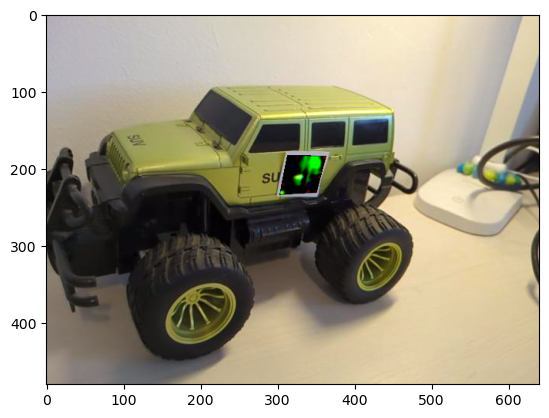

 11%|█         | 2/18 [00:01<00:17,  1.10s/it]

thresher: 0.113%
(array(['ambulance', 'half track', 'jeep', 'snowplow', 'thresher'],
      dtype='<U10'), array([ 5, 11, 11,  1,  2]))


 17%|█▋        | 3/18 [00:00<00:03,  4.63it/s]

Iteration 40, Train Loss: 0.1162


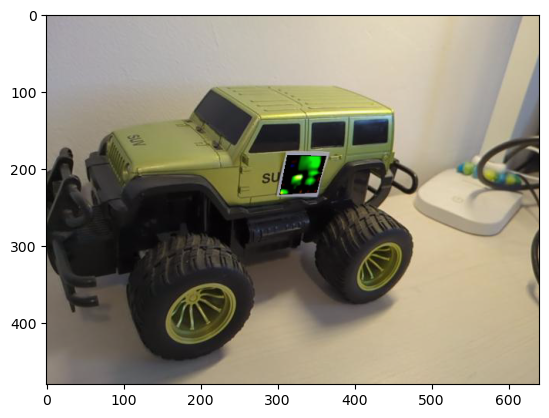

 22%|██▏       | 4/18 [00:02<00:09,  1.48it/s]

thresher: 0.113%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([13,  9,  2,  3,  3]))


 28%|██▊       | 5/18 [00:01<00:02,  5.75it/s]

Iteration 60, Train Loss: 0.1081


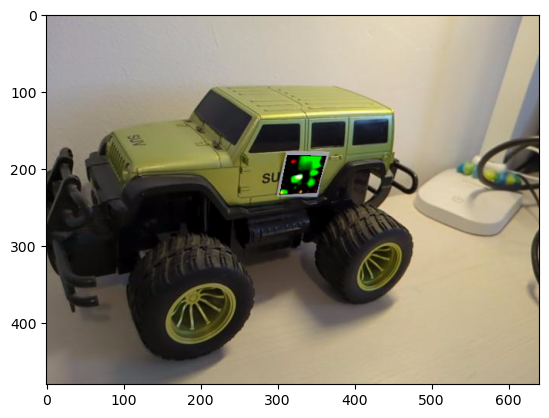

 33%|███▎      | 6/18 [00:02<00:06,  1.81it/s]

thresher: 0.111%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([11, 12,  2,  3,  2]))


 39%|███▉      | 7/18 [00:01<00:01,  5.99it/s]

Iteration 80, Train Loss: 0.0931


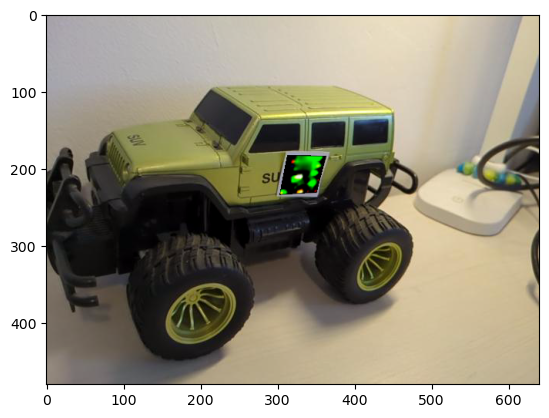

 44%|████▍     | 8/18 [00:02<00:05,  1.76it/s]

thresher: 0.111%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([11, 13,  1,  3,  2]))


 50%|█████     | 9/18 [00:01<00:01,  6.39it/s]

Iteration 100, Train Loss: 0.0962


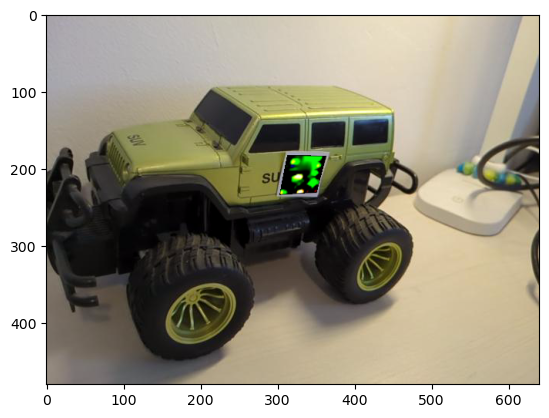

 56%|█████▌    | 10/18 [00:03<00:04,  1.82it/s]

thresher: 0.110%
(array(['amphibian', 'half track', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 1, 10, 13,  2,  2,  2]))


 61%|██████    | 11/18 [00:01<00:01,  6.63it/s]

Iteration 120, Train Loss: 0.0792


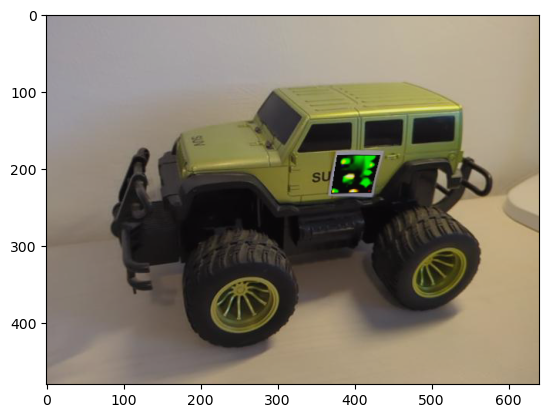

 67%|██████▋   | 12/18 [00:03<00:03,  1.88it/s]

thresher: 0.118%
(array(['amphibian', 'half track', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([2, 6, 8, 5, 9]))


 72%|███████▏  | 13/18 [00:02<00:00,  6.61it/s]

Iteration 140, Train Loss: 0.0722


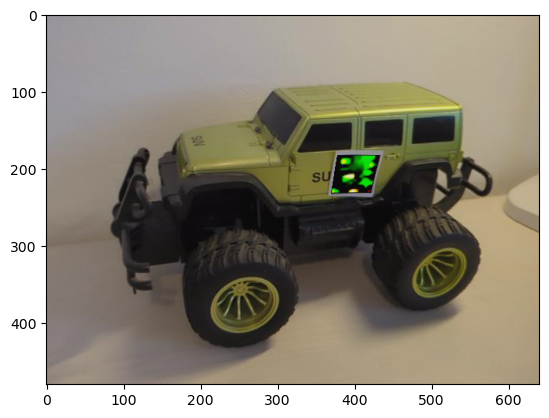

 78%|███████▊  | 14/18 [00:03<00:02,  1.99it/s]

thresher: 0.118%
(array(['amphibian', 'half track', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([2, 6, 6, 1, 6, 9]))


 83%|████████▎ | 15/18 [00:02<00:00,  6.77it/s]

Iteration 160, Train Loss: 0.0535


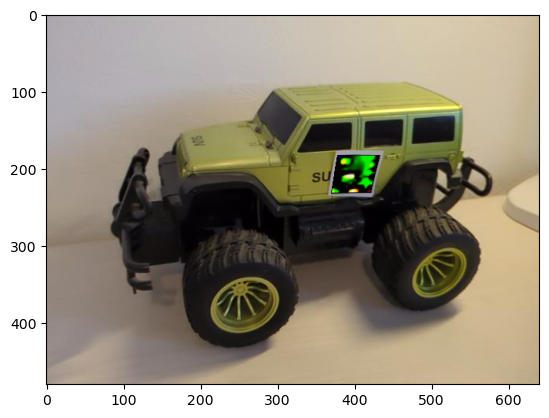

 89%|████████▉ | 16/18 [00:03<00:01,  1.86it/s]

thresher: 0.117%
(array(['amphibian', 'half track', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([2, 8, 8, 5, 7]))


 94%|█████████▍| 17/18 [00:03<00:00,  6.23it/s]

Iteration 180, Train Loss: 0.0607


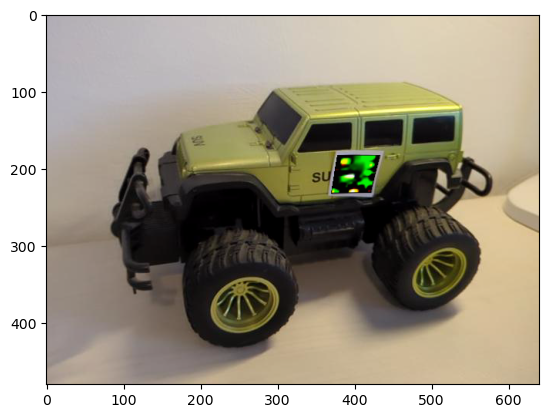

100%|██████████| 18/18 [00:04<00:00,  1.95it/s]

thresher: 0.113%
(array(['amphibian', 'half track', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 2, 10,  8,  2,  3,  5]))


  6%|▌         | 1/18 [00:00<00:08,  2.11it/s]

Iteration 200, Train Loss: 0.0541


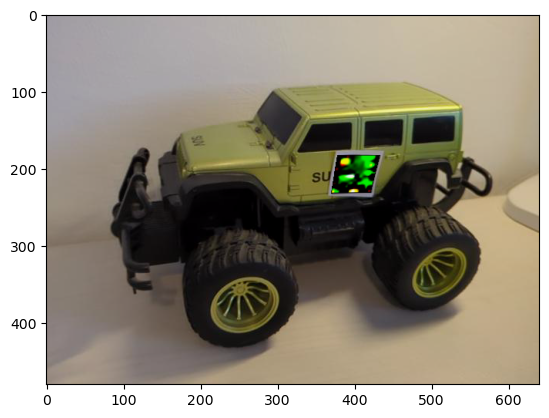

 11%|█         | 2/18 [00:01<00:15,  1.01it/s]

thresher: 0.115%
(array(['amphibian', 'half track', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 1, 10,  7,  2,  4,  6]))


 17%|█▋        | 3/18 [00:00<00:03,  4.48it/s]

Iteration 220, Train Loss: 0.1036


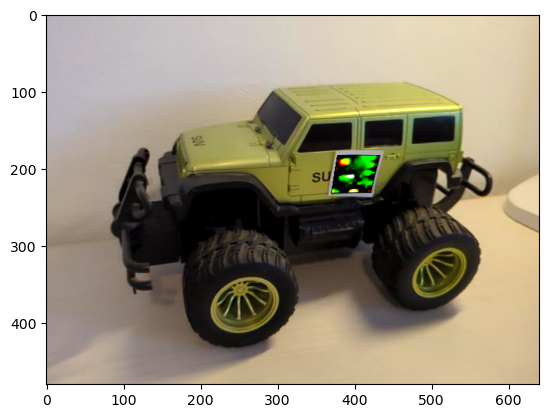

 22%|██▏       | 4/18 [00:02<00:09,  1.54it/s]

thresher: 0.114%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 8,  1, 10,  3,  3,  5]))


 28%|██▊       | 5/18 [00:01<00:02,  5.80it/s]

Iteration 240, Train Loss: 0.0893


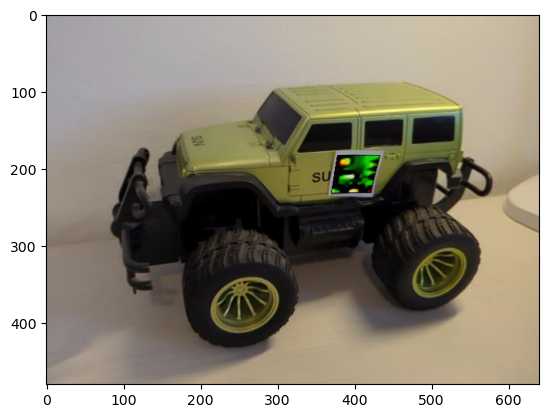

 33%|███▎      | 6/18 [00:02<00:07,  1.67it/s]

thresher: 0.113%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([14,  5,  2,  3,  6]))


 39%|███▉      | 7/18 [00:01<00:01,  6.21it/s]

Iteration 260, Train Loss: 0.0696


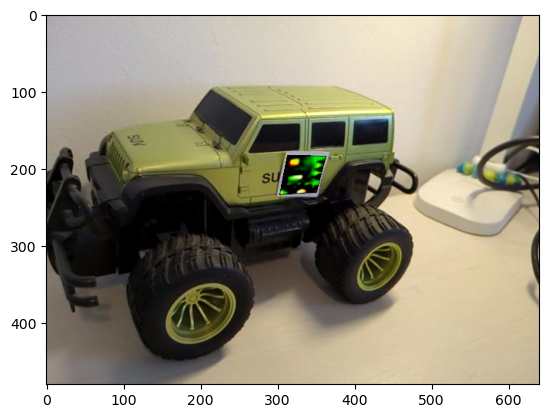

 44%|████▍     | 8/18 [00:02<00:05,  1.86it/s]

thresher: 0.110%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([14, 10,  3,  1,  2]))


 50%|█████     | 9/18 [00:01<00:01,  6.43it/s]

Iteration 280, Train Loss: 0.0830


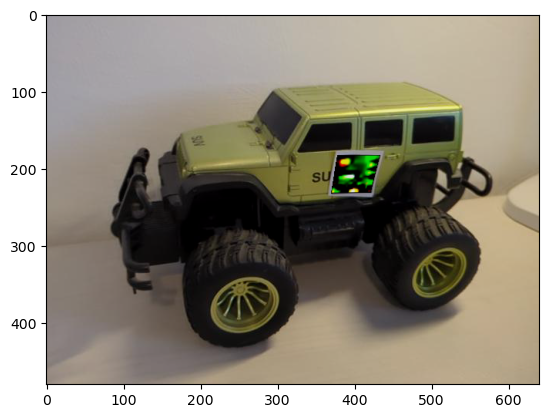

 56%|█████▌    | 10/18 [00:02<00:04,  1.96it/s]

thresher: 0.112%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([15,  7,  2,  3,  3]))


 61%|██████    | 11/18 [00:01<00:01,  6.31it/s]

Iteration 300, Train Loss: 0.1004


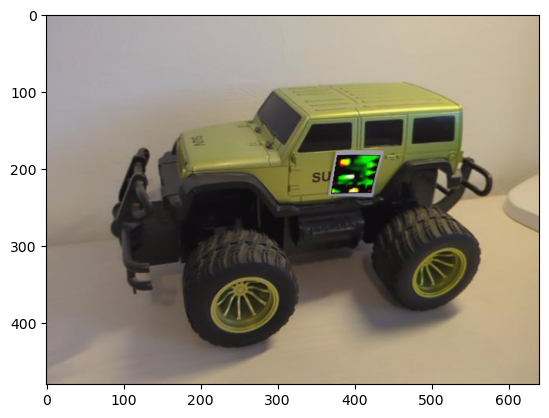

 67%|██████▋   | 12/18 [00:03<00:03,  1.89it/s]

thresher: 0.121%
(array(['amphibian', 'half track', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 1,  6,  4,  1,  8, 10]))


 72%|███████▏  | 13/18 [00:02<00:00,  6.40it/s]

Iteration 320, Train Loss: 0.0824


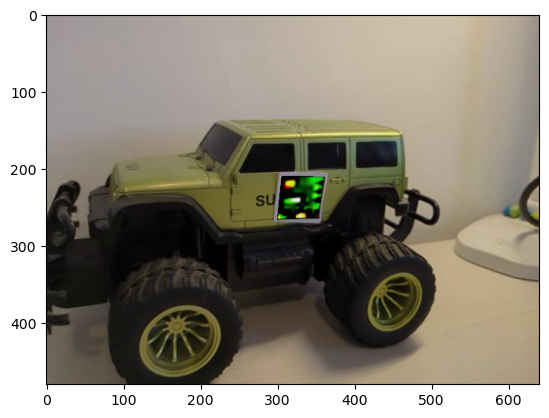

 78%|███████▊  | 14/18 [00:03<00:02,  1.92it/s]

thresher: 0.108%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([11,  6,  2,  4,  7]))


 83%|████████▎ | 15/18 [00:02<00:00,  6.11it/s]

Iteration 340, Train Loss: 0.0626


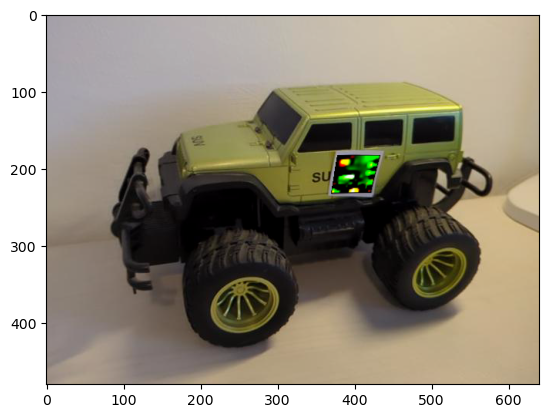

 89%|████████▉ | 16/18 [00:04<00:01,  1.70it/s]

thresher: 0.115%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([9, 1, 7, 3, 5, 5]))


 94%|█████████▍| 17/18 [00:02<00:00,  6.79it/s]

Iteration 360, Train Loss: 0.0748


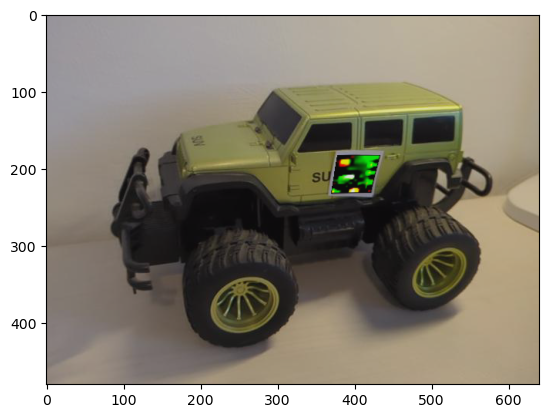

100%|██████████| 18/18 [00:04<00:00,  4.23it/s]

thresher: 0.117%
(array(['amphibian', 'half track', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 1,  7,  4,  1,  7, 10]))



  6%|▌         | 1/18 [00:00<00:08,  2.09it/s]

Iteration 380, Train Loss: 0.0810


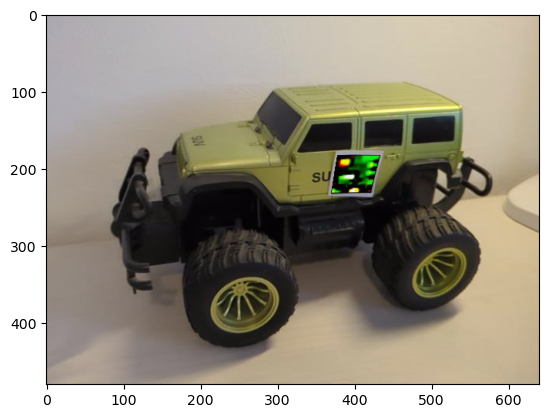

 11%|█         | 2/18 [00:01<00:15,  1.04it/s]

thresher: 0.114%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([10,  1,  5,  2,  5,  7]))


 17%|█▋        | 3/18 [00:00<00:03,  4.63it/s]

Iteration 400, Train Loss: 0.0561


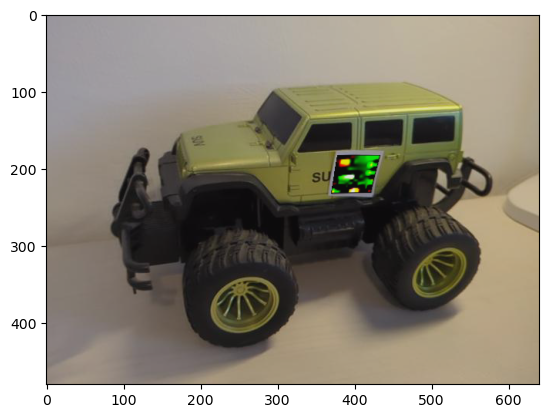

 22%|██▏       | 4/18 [00:02<00:09,  1.45it/s]

thresher: 0.118%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 7,  1,  4,  1,  7, 10]))


 28%|██▊       | 5/18 [00:01<00:02,  5.21it/s]

Iteration 420, Train Loss: 0.0705


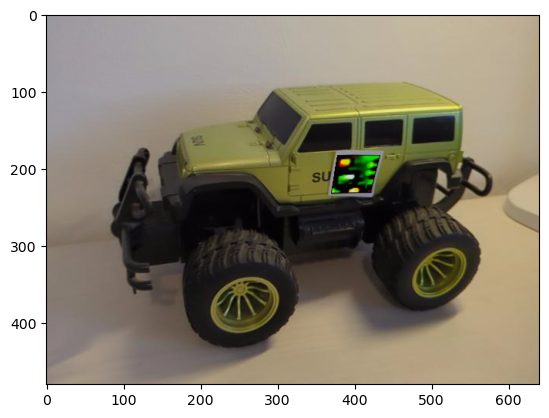

 33%|███▎      | 6/18 [00:02<00:07,  1.67it/s]

thresher: 0.119%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 5,  1,  6,  1,  7, 10]))


 39%|███▉      | 7/18 [00:01<00:01,  6.15it/s]

Iteration 440, Train Loss: 0.0750


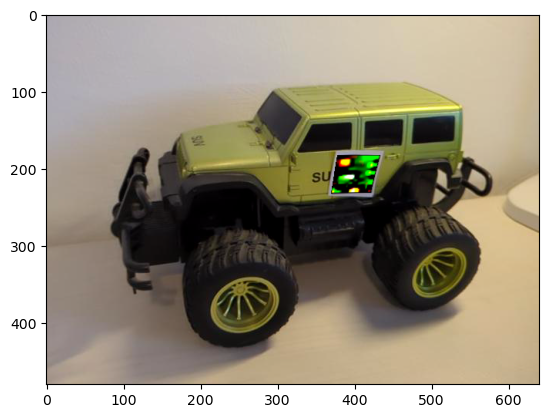

 44%|████▍     | 8/18 [00:02<00:05,  1.77it/s]

thresher: 0.116%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 6, 2, 8, 5]))


 50%|█████     | 9/18 [00:01<00:01,  6.25it/s]

Iteration 460, Train Loss: 0.0881


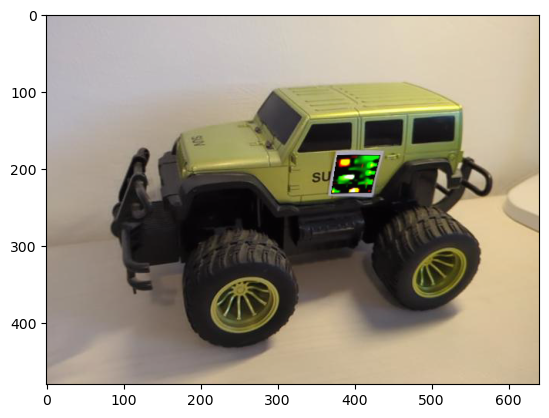

 56%|█████▌    | 10/18 [00:03<00:04,  1.83it/s]

thresher: 0.116%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([7, 1, 5, 1, 9, 7]))


 61%|██████    | 11/18 [00:02<00:01,  6.33it/s]

Iteration 480, Train Loss: 0.0775


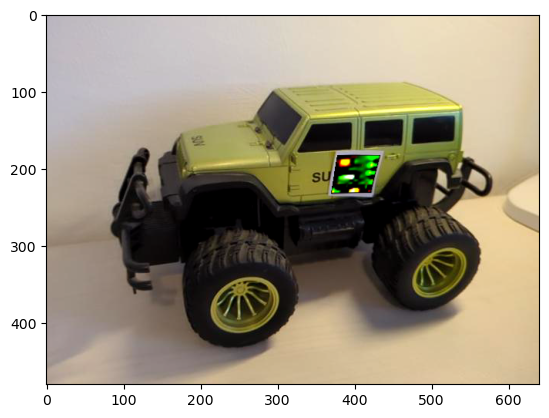

 67%|██████▋   | 12/18 [00:03<00:03,  1.91it/s]

thresher: 0.113%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 6, 5, 5, 5]))


 72%|███████▏  | 13/18 [00:02<00:00,  6.42it/s]

Iteration 500, Train Loss: 0.0593


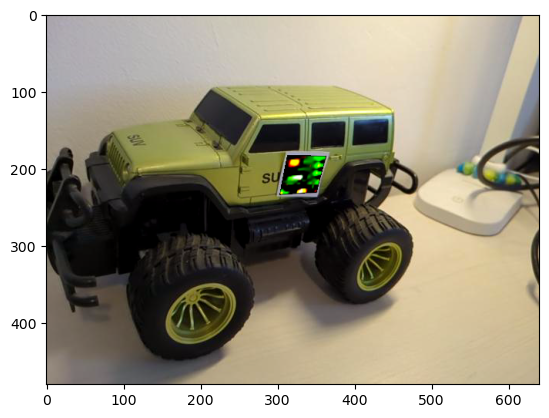

 78%|███████▊  | 14/18 [00:03<00:02,  1.83it/s]

thresher: 0.109%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([10,  1,  9,  4,  2,  4]))


 83%|████████▎ | 15/18 [00:02<00:00,  6.56it/s]

Iteration 520, Train Loss: 0.0655


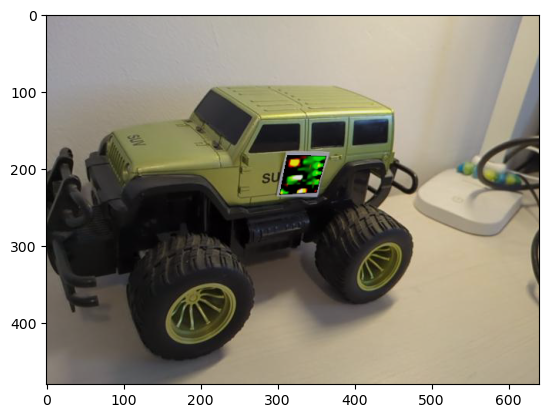

 89%|████████▉ | 16/18 [00:04<00:01,  1.85it/s]

thresher: 0.110%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([10,  1,  7,  1,  5,  6]))


 94%|█████████▍| 17/18 [00:02<00:00,  6.70it/s]

Iteration 540, Train Loss: 0.0657


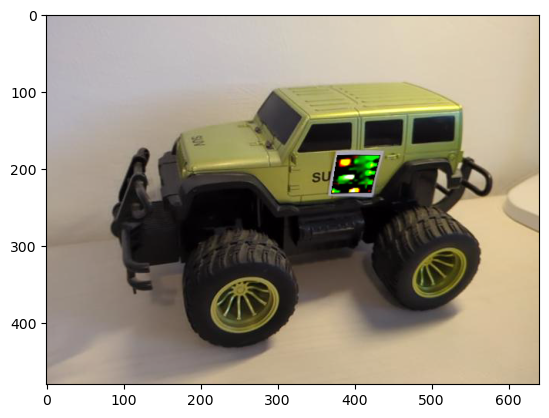

100%|██████████| 18/18 [00:04<00:00,  2.00it/s]

thresher: 0.115%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 6, 2, 7, 6]))


  6%|▌         | 1/18 [00:00<00:07,  2.20it/s]

Iteration 560, Train Loss: 0.0672


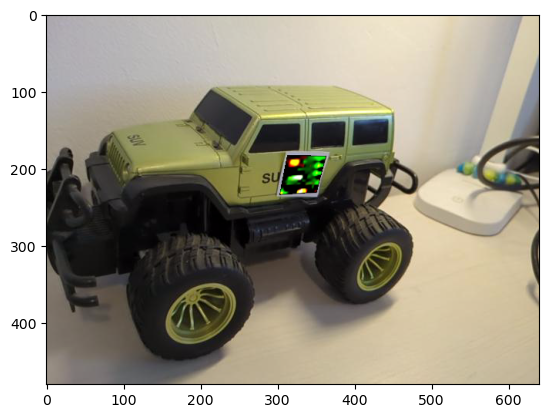

 11%|█         | 2/18 [00:01<00:16,  1.01s/it]

thresher: 0.110%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([11,  1,  5,  2,  5,  6]))


 17%|█▋        | 3/18 [00:00<00:03,  4.12it/s]

Iteration 580, Train Loss: 0.0549


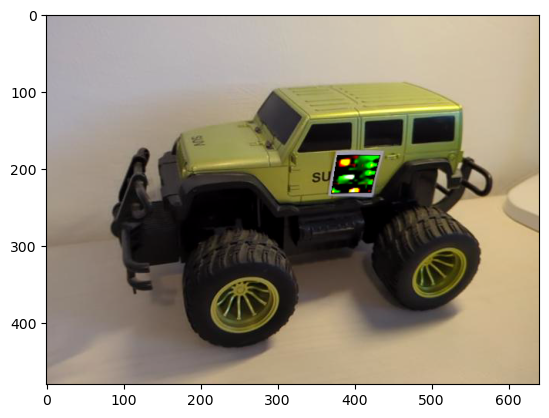

 22%|██▏       | 4/18 [00:02<00:10,  1.36it/s]

thresher: 0.116%
(array(['amphibian', 'half track', 'harvester', 'jeep', 'snowplow',
       'thresher', 'tractor'], dtype='<U10'), array([1, 7, 1, 6, 2, 7, 6]))


 28%|██▊       | 5/18 [00:01<00:02,  5.86it/s]

Iteration 600, Train Loss: 0.0763


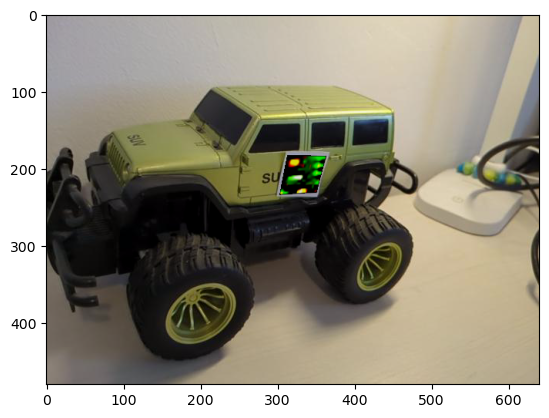

 33%|███▎      | 6/18 [00:02<00:06,  1.79it/s]

thresher: 0.110%
(array(['half track', 'jeep', 'snowplow', 'thresher', 'tractor'],
      dtype='<U10'), array([15,  6,  3,  2,  4]))


 39%|███▉      | 7/18 [00:01<00:01,  5.89it/s]

Iteration 620, Train Loss: 0.0664


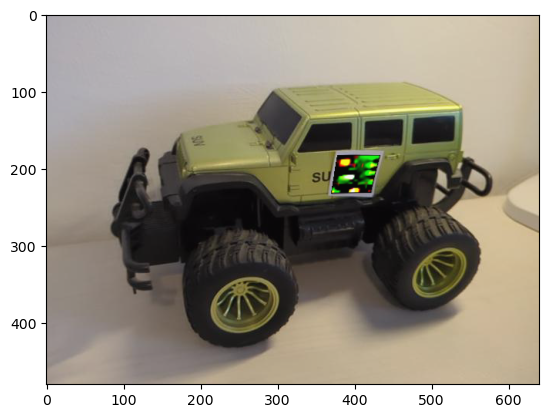

 44%|████▍     | 8/18 [00:03<00:06,  1.45it/s]

thresher: 0.114%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 5, 1, 7, 8]))


 50%|█████     | 9/18 [00:01<00:01,  6.48it/s]

Iteration 640, Train Loss: 0.0535


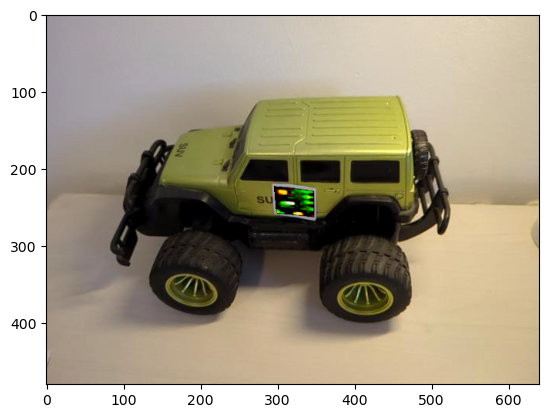

 56%|█████▌    | 10/18 [00:02<00:04,  1.96it/s]

harvester: 0.110%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([11,  1,  9,  4,  1,  4]))


 61%|██████    | 11/18 [00:01<00:01,  6.20it/s]

Iteration 660, Train Loss: 0.0646


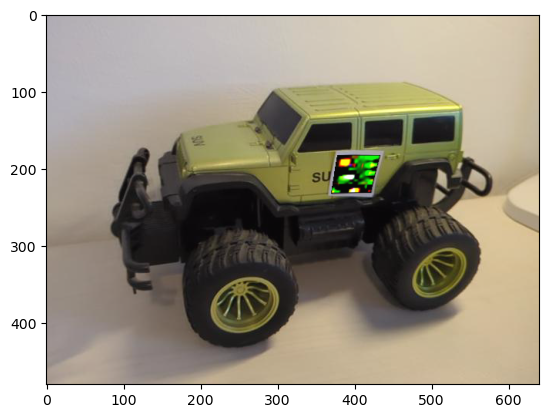

 67%|██████▋   | 12/18 [00:03<00:03,  1.88it/s]

thresher: 0.116%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([8, 1, 5, 7, 9]))


 72%|███████▏  | 13/18 [00:02<00:00,  6.19it/s]

Iteration 680, Train Loss: 0.0969


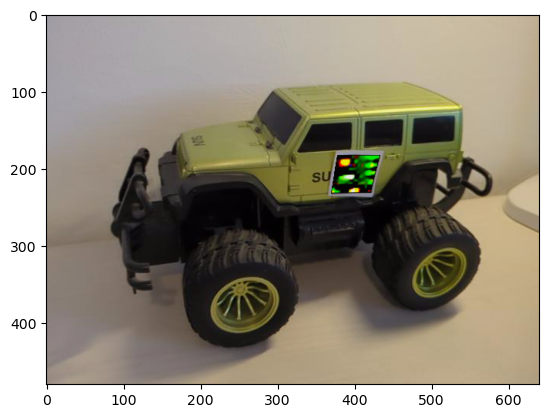

 78%|███████▊  | 14/18 [00:03<00:02,  1.87it/s]

thresher: 0.117%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([7, 1, 5, 8, 9]))


 83%|████████▎ | 15/18 [00:02<00:00,  6.58it/s]

Iteration 700, Train Loss: 0.1050


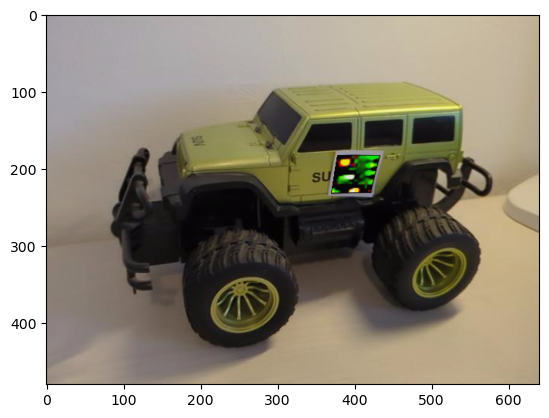

 89%|████████▉ | 16/18 [00:04<00:01,  1.87it/s]

thresher: 0.118%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([6, 1, 5, 9, 9]))


 94%|█████████▍| 17/18 [00:02<00:00,  6.52it/s]

Iteration 720, Train Loss: 0.0737


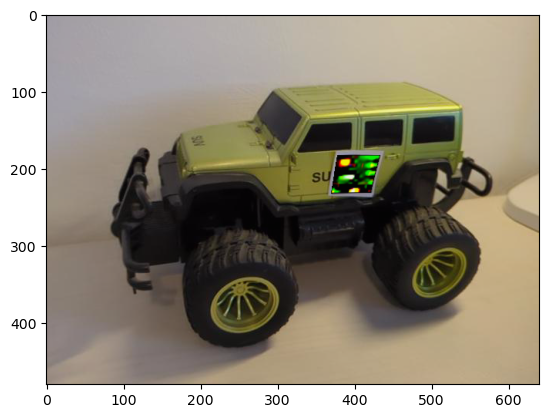

100%|██████████| 18/18 [00:04<00:00,  2.00it/s]

thresher: 0.119%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([5, 1, 5, 1, 9, 9]))


  6%|▌         | 1/18 [00:00<00:08,  2.08it/s]

Iteration 740, Train Loss: 0.0718


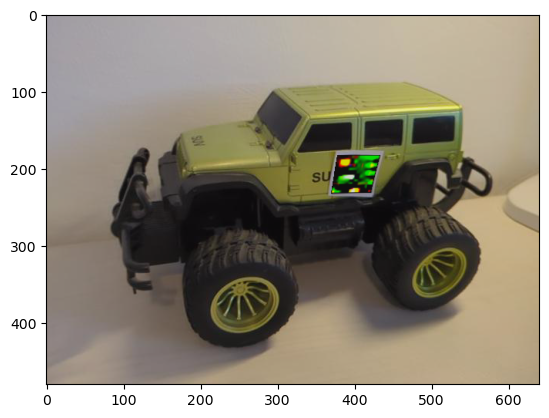

 11%|█         | 2/18 [00:01<00:16,  1.02s/it]

thresher: 0.122%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([ 5,  1,  4, 11,  9]))


 17%|█▋        | 3/18 [00:00<00:03,  4.51it/s]

Iteration 760, Train Loss: 0.0752


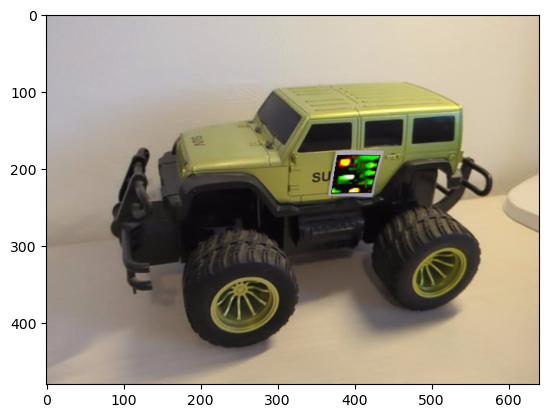

 22%|██▏       | 4/18 [00:02<00:09,  1.51it/s]

thresher: 0.116%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 4, 1, 9, 7]))


 28%|██▊       | 5/18 [00:01<00:02,  5.68it/s]

Iteration 780, Train Loss: 0.0708


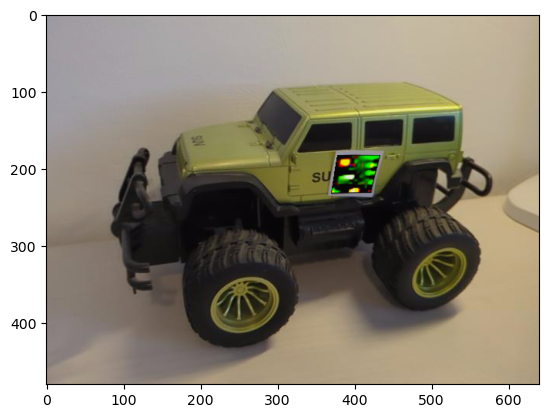

 33%|███▎      | 6/18 [00:02<00:07,  1.71it/s]

thresher: 0.119%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([5, 1, 5, 1, 9, 9]))


 39%|███▉      | 7/18 [00:01<00:01,  6.27it/s]

Iteration 800, Train Loss: 0.0724


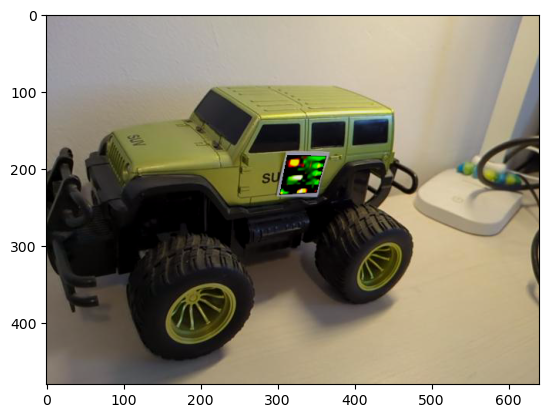

 44%|████▍     | 8/18 [00:02<00:05,  1.86it/s]

thresher: 0.110%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 8, 5, 3, 5]))


 50%|█████     | 9/18 [00:01<00:01,  6.52it/s]

Iteration 820, Train Loss: 0.0540


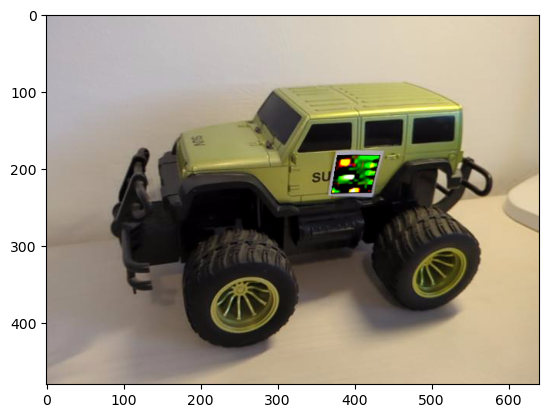

 56%|█████▌    | 10/18 [00:02<00:04,  1.98it/s]

thresher: 0.113%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 7, 2, 6, 6]))


 61%|██████    | 11/18 [00:01<00:01,  6.68it/s]

Iteration 840, Train Loss: 0.0563


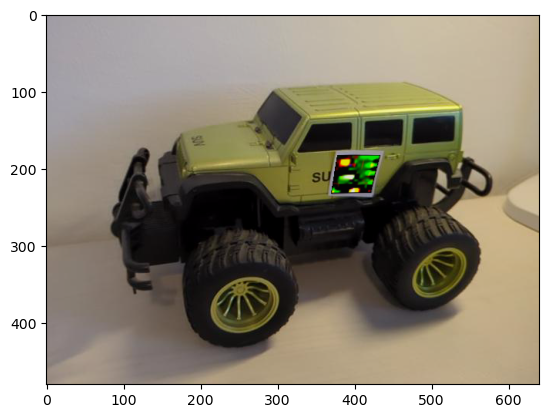

 67%|██████▋   | 12/18 [00:03<00:03,  1.99it/s]

thresher: 0.116%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([7, 1, 7, 7, 8]))


 72%|███████▏  | 13/18 [00:02<00:00,  6.51it/s]

Iteration 860, Train Loss: 0.0536


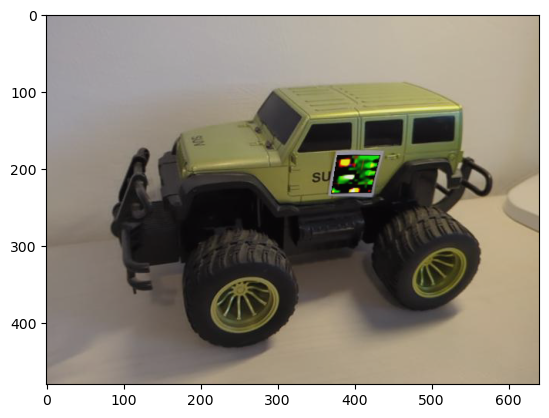

 78%|███████▊  | 14/18 [00:03<00:02,  1.96it/s]

thresher: 0.114%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([7, 1, 5, 1, 7, 9]))


 83%|████████▎ | 15/18 [00:02<00:00,  6.71it/s]

Iteration 880, Train Loss: 0.0612


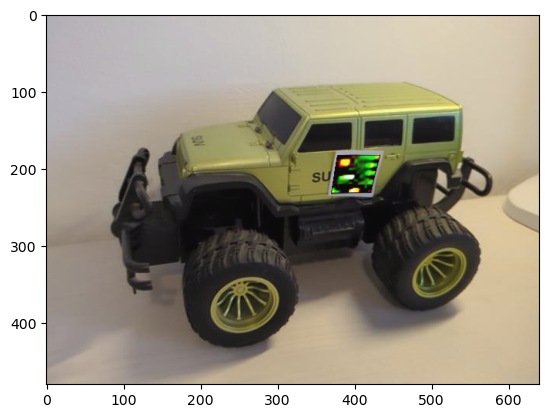

 89%|████████▉ | 16/18 [00:03<00:01,  1.99it/s]

thresher: 0.116%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([7, 1, 4, 9, 9]))


 94%|█████████▍| 17/18 [00:02<00:00,  6.65it/s]

Iteration 900, Train Loss: 0.0561


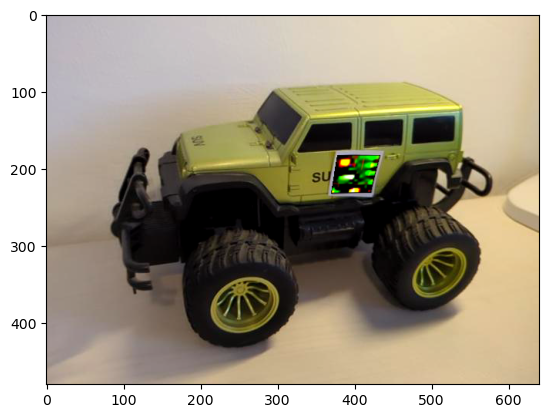

100%|██████████| 18/18 [00:04<00:00,  4.20it/s]

thresher: 0.113%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([7, 1, 8, 5, 4, 5]))



  6%|▌         | 1/18 [00:00<00:07,  2.21it/s]

Iteration 920, Train Loss: 0.0641


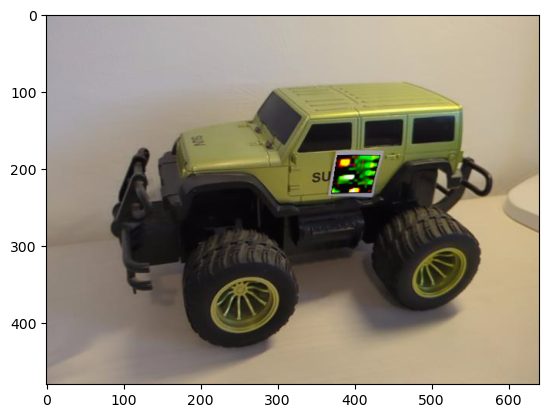

 11%|█         | 2/18 [00:02<00:18,  1.15s/it]

thresher: 0.117%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([6, 1, 5, 9, 9]))


 17%|█▋        | 3/18 [00:00<00:03,  4.52it/s]

Iteration 940, Train Loss: 0.0609


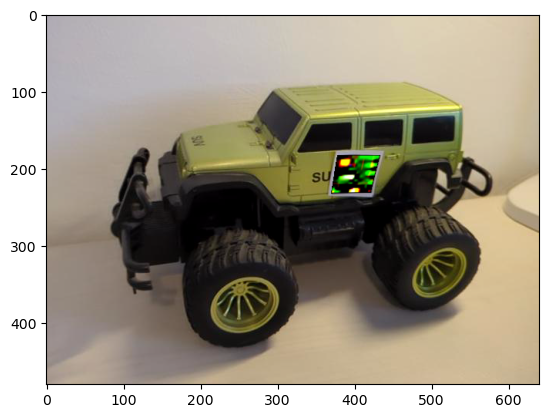

 22%|██▏       | 4/18 [00:02<00:09,  1.48it/s]

thresher: 0.114%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 6, 2, 6, 7]))


 28%|██▊       | 5/18 [00:01<00:02,  5.62it/s]

Iteration 960, Train Loss: 0.0584


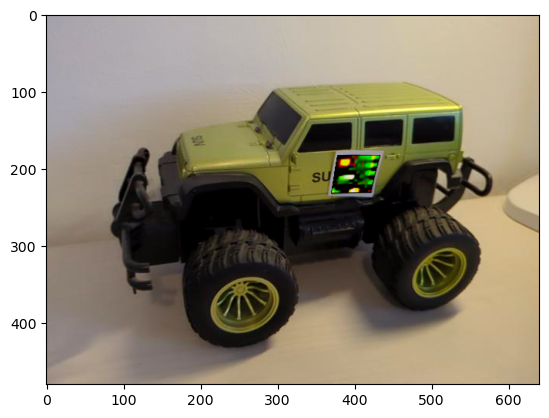

 33%|███▎      | 6/18 [00:02<00:06,  1.74it/s]

thresher: 0.115%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 8, 4, 5, 4]))


 39%|███▉      | 7/18 [00:01<00:01,  6.06it/s]

Iteration 980, Train Loss: 0.0479


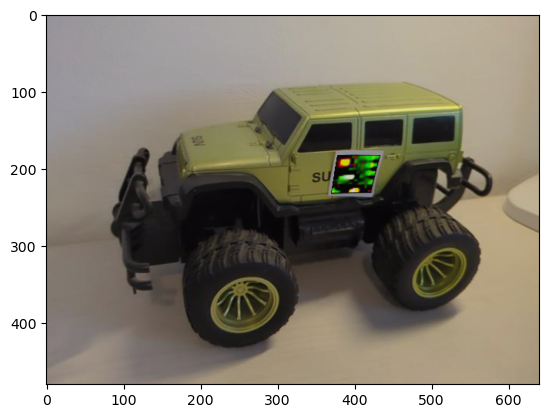

 44%|████▍     | 8/18 [00:02<00:05,  1.75it/s]

thresher: 0.117%
(array(['half track', 'harvester', 'jeep', 'thresher', 'tractor'],
      dtype='<U10'), array([ 7,  1,  5,  7, 10]))


 50%|█████     | 9/18 [00:01<00:01,  6.46it/s]

Iteration 1000, Train Loss: 0.0834


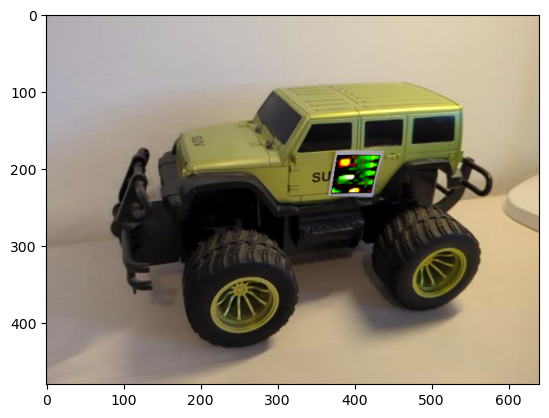

 56%|█████▌    | 10/18 [00:02<00:04,  1.94it/s]

thresher: 0.115%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([7, 1, 5, 1, 9, 7]))


 61%|██████    | 11/18 [00:02<00:01,  6.47it/s]

Iteration 1020, Train Loss: 0.0584


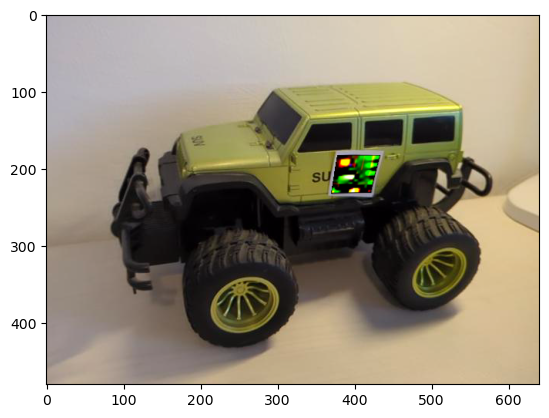

 67%|██████▋   | 12/18 [00:03<00:03,  1.76it/s]

thresher: 0.118%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([ 5,  1,  5,  1, 10,  8]))


 72%|███████▏  | 13/18 [00:02<00:00,  6.67it/s]

Iteration 1040, Train Loss: 0.0391


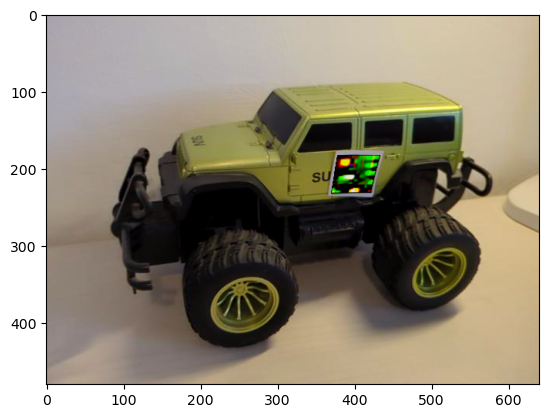

 78%|███████▊  | 14/18 [00:03<00:02,  1.92it/s]

thresher: 0.114%
(array(['half track', 'harvester', 'jeep', 'snowplow', 'thresher',
       'tractor'], dtype='<U10'), array([8, 1, 7, 4, 5, 5]))


 83%|████████▎ | 15/18 [00:02<00:00,  6.45it/s]

Iteration 1060, Train Loss: 0.0423


 83%|████████▎ | 15/18 [00:03<00:00,  4.43it/s]


KeyboardInterrupt: 

In [20]:
i = 0 
# blend_ratio = 1
for epoch in range(1000):
    for frames, H_t in tqdm.tqdm(train_loader):

        i += 1
        # adv_loss = lbfgs_latent_opt.step(latent_closure_adp)

        frames = frames.to('cuda')

        latent_mod = model(frames).float()
        blend_ratio = 1#torch.rand(1).cuda() * 0.5 + 0.5
        # if i < 100:
        #     jitter = lambda x: x
        # else:
        #     jitter = T.ColorJitter(brightness=0.1,contrast=0.1,saturation=0.1)
            
        opt.zero_grad()
        adv_patch = latent_mod#decode_latents_grad(latent_mod).float()
        adv_patch_m = mapper(adv_patch)# jitter(mapper(adv_patch))

        # w_mask  =warp(adv_patch_m*0+1)
        # w  =warp(adv_patch_m)
        w_mask  = kornia.geometry.transform.warp_perspective(adv_patch_m*0 + 1, H_t.cuda(), dst_img_shape)
        w  =  kornia.geometry.transform.warp_perspective(adv_patch_m, H_t.cuda(), dst_img_shape)

        sum_tensor = ((w_mask != 0) * -blend_ratio + 1) * frames + w *blend_ratio

        sum_tensor = jitter_total_photo(sum_tensor)
        
        # sum_tensor = sum_tensor.view(sum_tensor.shape[0]*sum_tensor.shape[1], sum_tensor.shape[2], sum_tensor.shape[3], sum_tensor.shape[4])

        adv_loss = adv_loss_calc2(sum_tensor).mean() #+ adv_patch.norm() / 10000
        
        adv_loss.backward()

        # print(model.encoder[-1].weight.grad.max())
        if i % 1 == 0:
            opt.step()

        if i % 20 == 0:
            # print(f"Iteration {i}, Loss: {latent_closure_adp().item():.4f}")
            print(f"Iteration {i}, Train Loss: {adv_loss.item():.4f}")

            frames, H_t = next(iter(test_loader))
            frames = frames.to('cuda')


            with torch.no_grad():
                
                latent_mod = model(frames).float()


                adv_patch = latent_mod#decode_latents(latent_mod).float()
                
                adv_patch_m = mapper(adv_patch)# jitter(mapper(adv_patch))

                # w_mask  =warp(adv_patch_m*0+1)
                # w  =warp(adv_patch_m)
                w_mask  = kornia.geometry.transform.warp_perspective(adv_patch_m*0 + 1, H_t.cuda(), dst_img_shape)
                w  =  kornia.geometry.transform.warp_perspective(adv_patch_m, H_t.cuda(), dst_img_shape)

                sum_tensor = ((w_mask != 0) * -blend_ratio + 1) * frames + w *blend_ratio

                sum_tensor = jitter_total_photo(sum_tensor)

                adv_loss = adv_loss_calc2(sum_tensor)

                sum_tensor = sum_tensor.cpu()
                argmin = torch.argmin(adv_loss).cpu().item()

                plt.imshow(sum_tensor[argmin].permute(1,2,0).numpy())
                plt.show()
                print(resnet_predict(sum_tensor[argmin].unsqueeze(0).cuda()))

                test_pred = resnet_predict(sum_tensor.cuda())
                if type(test_pred) == list:
                    print(np.unique(resnet_predict(sum_tensor.cuda()),return_counts=True))
                # print(lx)

In [21]:
# load ref.png
ref = cv2.imread('ref.png')


gray = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)

corners, ids, _ = detector.detectMarkers(gray)

if ids is not None:

    dst_pts = corners[0][0]
    H_ref, _ = cv2.findHomography(orig_img_corners, dst_pts, cv2.RANSAC)

H_ref_t = torch.from_numpy(H_ref).cuda()




In [22]:
ref_t = tt(ref).unsqueeze(0).cuda()

In [23]:
with torch.no_grad():
        pred_ref = model(ref_t).float()

w = kornia.geometry.transform.warp_perspective(pred_ref, H_ref_t.float().unsqueeze(0), dst_img_shape)

w_mask  = kornia.geometry.transform.warp_perspective(pred_ref*0 + 1, H_ref_t.float().unsqueeze(0), dst_img_shape)

sum_tensor = ((w_mask != 0) * -blend_ratio + 1) * ref_t + w *blend_ratio

In [24]:
resnet_predict(sum_tensor.cuda())

'thresher: 0.106%'

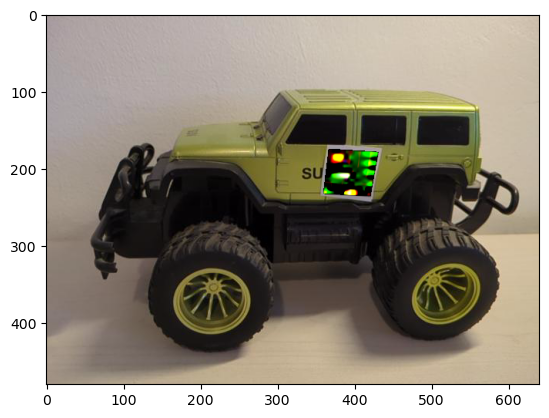

In [25]:
plt.imshow(sum_tensor[0].permute(1,2,0).cpu().numpy())

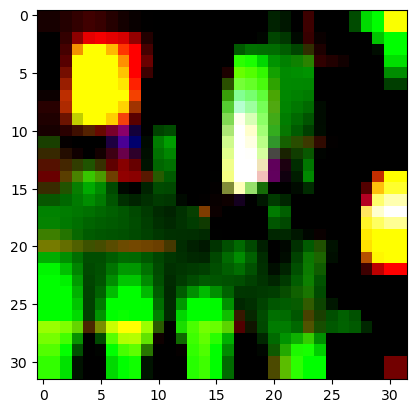

In [27]:
plt.imshow(pred_ref[0].permute(1,2,0).cpu().numpy())

In [28]:
# save pred_ref as ref_pred.png
cv2.imwrite('ref_pred.png', pred_ref[0].permute(1,2,0).cpu().numpy()*255)

True